In [1]:
import numpy as np
import cv2
#from sklearn.model_selection import train_test_split
import math
import matplotlib.pyplot as plt
%matplotlib inline
#plt.style.use('ggplot')
import seaborn as sns

In [2]:
drive_log = './data_from_udacity/data/driving_log.csv'

def load_data():
    with open(drive_log, 'r') as f:
        f.readline()
        data = [line.strip().split(', ') for line in f]
    return data
data = load_data()
print('Data provided by Udacity contains:')
print('   {0} drive logs'.format(len(data))) 
print('   {0} frames which come from center, left and right camera '.format(3*len(data)))

Data provided by Udacity contains:
   8036 drive logs
   24108 frames which come from center, left and right camera 


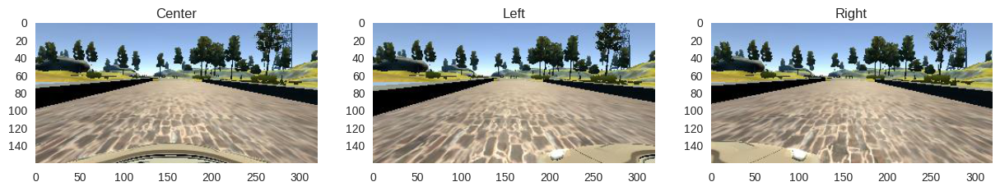

In [3]:
# Plot center, left, right camera
sns.set_style({'axes.grid' : False})
fig, axes = plt.subplots(1,3, figsize = (15,24))
titles = ['Center', 'Left', 'Right']
for i in range(3):
    axes[i].imshow(cv2.cvtColor(cv2.imread('./data/'+data[0][i]), cv2.COLOR_BGR2RGB))
    axes[i].set_title(titles[i])
    

In [4]:
steer_log = [float(log[3]) for log in data]
throttle_log = [float(log[4]) for log in data]
break_log = [float(log[5]) for log in data]
speed_log = [float(log[6]) for log in data]

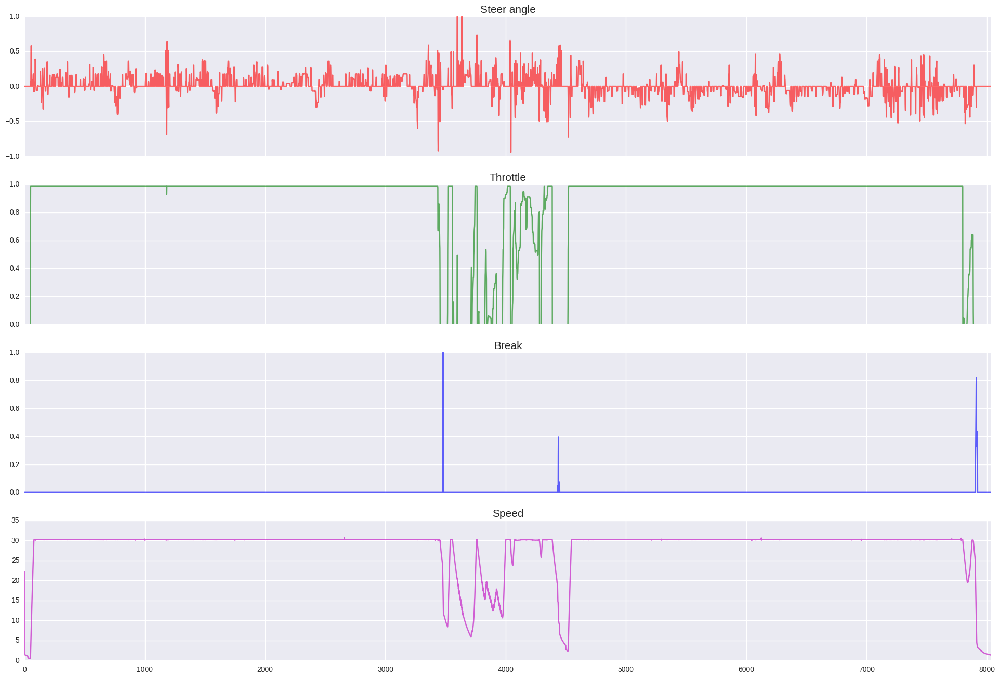

In [5]:
sns.set_style({'axes.grid' : True})
fig, axes = plt.subplots(4,1, figsize = (24,16))
axes[0].plot(steer_log, 'r', alpha = 0.6, label = 'steer angle')
axes[0].set_title('Steer angle', fontsize = 15)
axes[1].plot(throttle_log, 'g', alpha = 0.6, label = 'throttle')
axes[1].set_title('Throttle', fontsize = 15)
axes[2].plot(break_log, 'b', alpha = 0.6, label = 'break')
axes[2].set_title('Break', fontsize = 15)
axes[3].plot(speed_log, 'm', alpha = 0.6, label = 'speed')
axes[3].set_title('Speed', fontsize = 15)
axes[3].set_xlim(0,len(data))
for i in range(3):
    plt.setp(axes[i].get_xticklabels(), visible=False)
    axes[i].set_xlim(0,len(data))


In [6]:
max_steer, min_steer, mean_steer = np.max(steer_log), np.min(steer_log), np.mean(steer_log)
print('max_steer: {0}\nmin_steer: {1:.4f}\nmean_steer: {2:.4f}'.format(max_steer, min_steer, mean_steer))
#print(len([s for s in steer_log if abs(s) < 0.01]))
print(len([s for s in steer_log if s == 0.]))

max_steer: 1.0
min_steer: -0.9427
mean_steer: 0.0041
4361


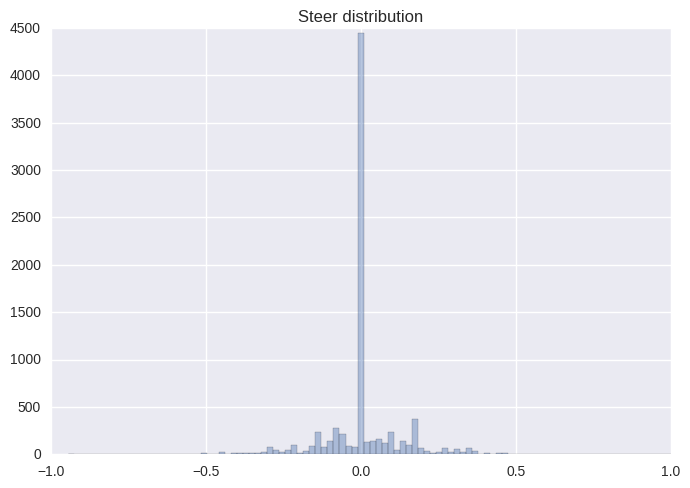

In [7]:
# histogram of steer_angle
sns.distplot(steer_log, kde=False, bins=100)
plt.title('Steer distribution')

### Data preprocessing and augmentation

#### Using left and right camera images

Beside center camera, we also use left and right camera for training. By adding a small angle (0.25) to 
the left camera and subtracting a small angle (0.25) from the right camera, we force the car to recover if it wanders off the side.

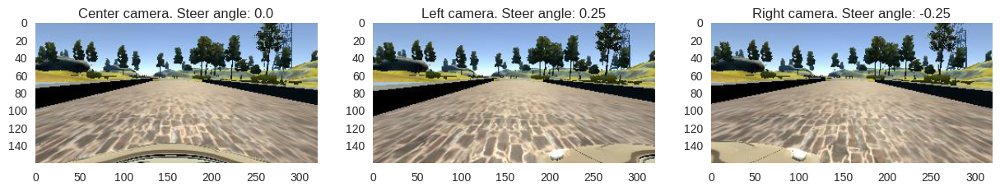

In [8]:
# Plot center, left, right camera
sns.set_style({'axes.grid' : False})
fig, axes = plt.subplots(1,3, figsize = (15,24))
titles = ['Center', 'Left', 'Right']
angle = float(data[0][3])
angles = [angle, angle + 0.25, angle - 0.25 ]
for i in range(3):
    axes[i].imshow(cv2.cvtColor(cv2.imread('./data/'+data[0][i]), cv2.COLOR_BGR2RGB))
    axes[i].set_title(titles[i] + ' camera. Steer angle: {}'.format(angles[i]) )

In [27]:
def choose_frame():
    camera = np.random.randint(3)
    num_frame = np.random.randint(len(data))
    frame = cv2.cvtColor(cv2.imread('./data/'+ data[num_frame][camera]), cv2.COLOR_BGR2RGB)
   
    if camera == 2:
        steer = np.float32(data[num_frame][3]) - .25
    else:
        steer = np.float32(data[num_frame][3]) + .25 * camera
    
    return frame, steer, camera

def flip(frame, steer, always_flip = False):
    flip = np.random.randint(1)
    if always_flip or flip == 1:
        new_frame = frame[:, ::-1, :]
        new_steer = -steer
    return new_frame, new_steer

def bright_adjust(frame):
    # Randomly adjust brightness
    new_frame = cv2.cvtColor(frame, cv2.COLOR_RGB2HSV)
    #random_bright = .25 + np.random.uniform()
    random_bright = 0.5
    new_frame[:, :, 2] = new_frame[:, :, 2] * random_bright
    #new_frame = np.clip(new_frame, 0, 255)
    new_frame = cv2.cvtColor(new_frame, cv2.COLOR_HSV2RGB)
    return new_frame
    
def shift(frame, steer):    
    # Horizontal and vertical and shifts
    horizontal_shift = np.random.randint(-25, 26)
    #vertical_shift = np.random.randint(-10,11)
    vertical_shift = 0
    
    rows, cols = frame.shape[:2]
    M = np.float32([[1, 0, horizontal_shift], [0, 1, vertical_shift]])
    new_frame = cv2.warpAffine(frame, M, (cols, rows))
    new_steer = steer + 0.035 * horizontal_shift
    return new_frame, new_steer

def crop(frame):
    n_row, n_col = frame.shape[:2]
    new_frame = frame[math.floor(n_row / 5):n_row - 25, 25:n_col - 25]
    return new_frame

def resize(frame):
    new_size_row, new_size_col = 64, 64
    new_frame = cv2.resize(frame, (new_size_col, new_size_row), interpolation=cv2.INTER_AREA)
    return new_frame

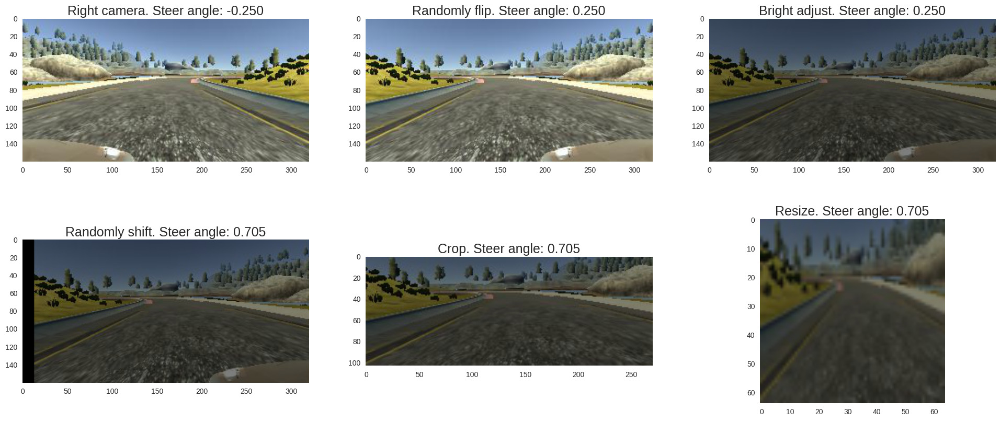

In [32]:
sns.set_style({'axes.grid' : False})
fig, axes = plt.subplots(2,3, figsize = (24,10))
frame, steer, camera  = choose_frame()
axes.flat[0].imshow(frame)
axes.flat[0].set_title('{0} camera. Steer angle: {1:.3f}'.format(titles[camera], steer), fontsize = 18) 

frame, steer = flip(frame, steer, True)
axes.flat[1].imshow(frame)
axes.flat[1].set_title('Randomly flip. Steer angle: {0:.3f}'.format(steer), fontsize = 18) 

frame = bright_adjust(frame)
axes.flat[2].imshow(frame)
axes.flat[2].set_title('Bright adjust. Steer angle: {0:.3f}'.format(steer), fontsize = 18) 

frame, steer = shift(frame, steer)
axes.flat[3].imshow(frame)
axes.flat[3].set_title('Randomly shift. Steer angle: {0:.3f}'.format(steer), fontsize = 18) 

frame = crop(frame)
axes.flat[4].imshow(frame)
axes.flat[4].set_title('Crop. Steer angle: {0:.3f}'.format(steer), fontsize = 18)

frame = resize(frame)
axes.flat[5].imshow(frame)
axes.flat[5].set_title('Resize. Steer angle: {0:.3f}'.format(steer), fontsize = 18) 

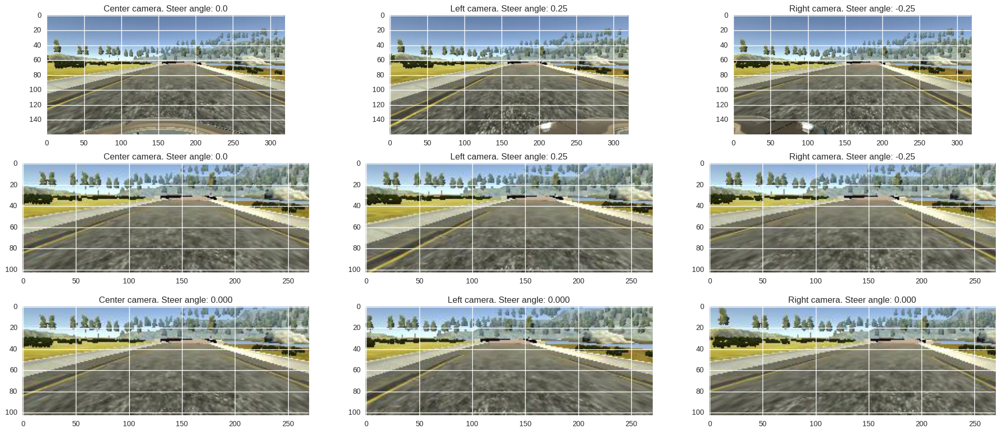

In [23]:
sns.set_style({'axes.grid' : True})

def horizontal_shift(frame, steer, px):
    
    rows, cols = frame.shape[:2]
    M = np.float32([[1, 0, px], [0, 1, 0]])
    new_frame = cv2.warpAffine(frame, M, (cols, rows))
    new_steer = steer + 0.01 * px
    return new_frame, new_steer
    

#num_frame = np.random.randint(len(data))
num_frame = 50

fig, axes = plt.subplots(3,3, figsize = (24,10))
titles = ['Center', 'Left', 'Right']
angle = float(data[0][3])
angles = [angle, angle + 0.25, angle - 0.25 ]
for i in range(3):
    img = cv2.cvtColor(cv2.imread('./data/'+data[num_frame][i]), cv2.COLOR_BGR2RGB)
    axes[0,i].imshow(img)
    axes[0,i].set_title(titles[i] + ' camera. Steer angle: {}'.format(angles[i]) )
    
    cropped_img = crop(img)
    axes[1,i].imshow(cropped_img)
    axes[1,i].set_title(titles[i] + ' camera. Steer angle: {}'.format(angles[i]) )
    
    if i == 0:
        axes[2,i].imshow(cropped_img)
        axes[2,i].set_title(titles[i] + ' camera. Steer angle: {:.3f}'.format(angles[i]))
    elif i == 1:
        left_img, left_steer = horizontal_shift(img, angles[1], -25)
        left_img = crop(left_img)
        axes[2,i].imshow(left_img)
        axes[2,i].set_title(titles[i] + ' camera. Steer angle: {:.3f}'.format(left_steer))
    else:
        right_img, right_steer = horizontal_shift(img, angles[2], 25)
        right_img = crop(right_img)
        axes[2,i].imshow(right_img)
        axes[2,i].set_title(titles[i] + ' camera. Steer angle: {:.3f}'.format(right_steer))
    

In [33]:
def steer_transform(steer):
    
    # chose camera
    #camera = np.random.choice([-1,0,1], p = [.25,.5,.25])
    camera = np.random.choice([-1,0,1])
    
    steer = steer + .25 * camera
    
    #print(steer)
    
    # randomly flip
    
    #print(steer)
    
    # randomly shift
    horizontal_shift = np.random.randint(-25, 26)
    steer += 0.035 * horizontal_shift

    
    return steer
print(steer_transform(0.0))

-0.105


401800


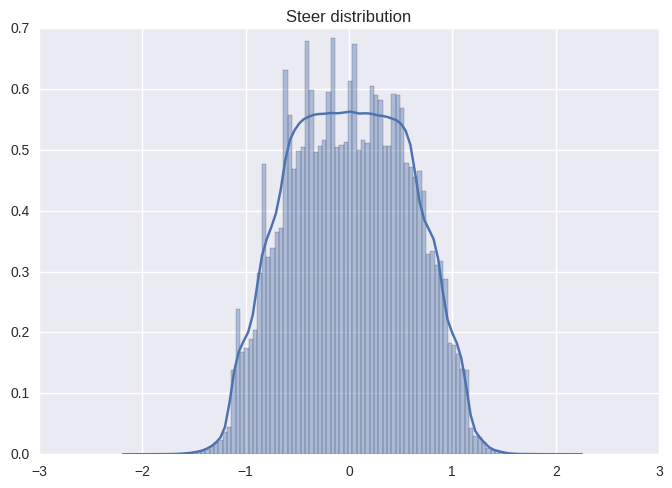

In [35]:
training_steer_log = [steer_transform(steer) for steer in steer_log*50]
print(len(training_steer_log))
sns.set_style({'axes.grid' : True})
sns.distplot(training_steer_log, kde=True, bins=100)
plt.title('Steer distribution')

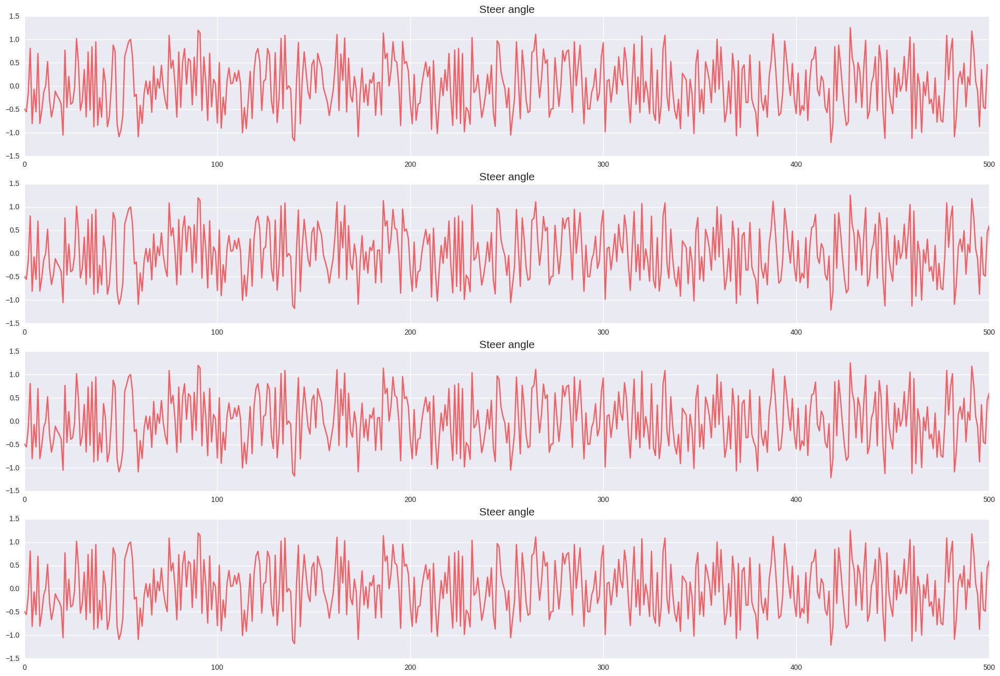

In [36]:
n = 500
sns.set_style({'axes.grid' : True})
fig, axes = plt.subplots(4,1, figsize = (24,16))
for i in range(4):
    axes[i].plot(training_steer_log[:n*(i+1)], 'r', alpha = 0.6, label = 'steer angle')
    axes[i].set_title('Steer angle', fontsize = 15)
    axes[i].set_xlim(0,n)

In [37]:
with open('./logs_7/history.csv', 'r') as f:
    batch_loss = []
    val_loss = []
    f.readline()
    for line in f:
        splitted_line = line.split(',')
        batch_loss.append(float(splitted_line[1]))
        val_loss.append(float(splitted_line[2]))

In [38]:
print(len(batch_loss), len(val_loss))

100 100


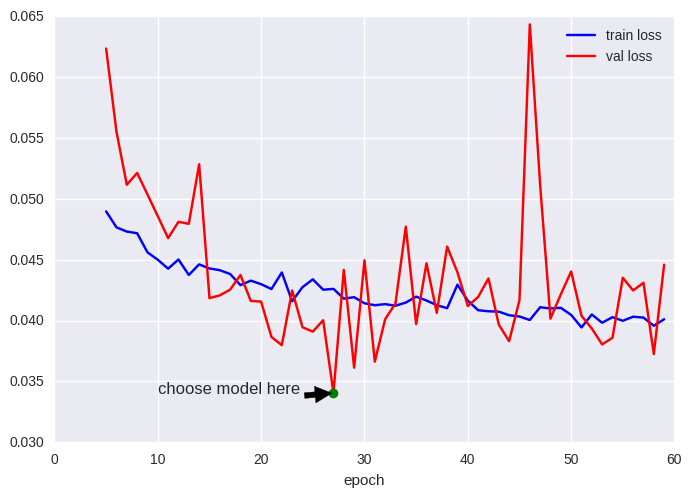

In [69]:
sns.set_style({'axes.grid' : True})
fig, ax = plt.subplots()
plt.plot(range(5,60), batch_loss[5:60], 'b', label = 'train loss')
plt.plot(range(5,60), val_loss[5:60], 'r', label = 'val loss')
plt.xlabel('epoch')
#x = 27, y = val_loss[27]
plt.plot(27, val_loss[27], 'go')
ax.annotate('choose model here', xy=(27, val_loss[27]), xytext=(10, val_loss[27]),
            arrowprops=dict(facecolor='black', shrink=0.05),
            )
plt.legend()
#plt.title('Steer distribution')

In [61]:
import numpy as np
import cv2
from sklearn.model_selection import train_test_split
import math

drive_file = './data_from_udacity/data/driving_log.csv'
test_size = 0.2
batch_size = 512
adjust_angle = 0.25
n_row = 160
n_col = 320
new_size_col, new_size_row = 64 , 64



def load_split_data():
    with open(drive_file, 'r') as f:
        f.readline()
        data = [line.strip().split(', ') for line in f]
        train_data, val_data = train_test_split(data, test_size=test_size, random_state=2017)
    return train_data, val_data

def data_generator(data):
    n_sample = len(data)
    next_epoch = True

    while True:
        if next_epoch:
            indices = np.arange(n_sample)
            np.random.shuffle(indices)
            yield data[indices[0]]
            ind = 1
            next_epoch = False
        else:
            yield data[indices[ind]]
            ind += 1
            if ind >= n_sample:
                next_epoch = True


def train_batch_generator(data):
    ind = 0

    for info_frame in data_generator(data):
        if ind == 0:
            batch_sample = np.zeros((batch_size, new_size_col, new_size_row, 3))
            batch_steer = np.zeros((batch_size,))

        # Randomly choose center, left or right frame
        chosen_frame = np.random.randint(3)
        #print('chosen_frame ', chosen_frame)
        frame = cv2.imread('./data_from_udacity/data/'+ info_frame[chosen_frame])

        if chosen_frame == 2:
            steer = np.float32(info_frame[3]) - adjust_angle
        else:
            steer = np.float32(info_frame[3]) + adjust_angle * chosen_frame

        # Randomly flip the frame
        flip = np.random.randint(1)
        if flip == 1:
            frame = frame[:, ::-1, :]
            steer *= -1

        # Randomly adjust brightness
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2HSV)
        random_bright = .25 + np.random.uniform()
        frame[:, :, 2] = frame[:, :, 2] * random_bright
        frame = np.clip(frame, 0, 255)
        frame = cv2.cvtColor(frame, cv2.COLOR_HSV2RGB)

        # Horizontal and shifts
        shift = np.random.randint(-25, 26)
        rows, cols = frame.shape[:2]
        M = np.float32([[1, 0, shift], [0, 1, 0]])
        frame = cv2.warpAffine(frame, M, (cols, rows))
        steer += 0.04 * shift

        frame = frame[math.floor(n_row / 5):n_row - 25, 0:n_col]

        frame = cv2.resize(frame, (new_size_col, new_size_row), interpolation=cv2.INTER_AREA)

        batch_sample[ind] = frame
        batch_steer[ind] = steer

        ind += 1

        if ind == batch_size:
            yield batch_sample, batch_steer
            ind = 0

In [63]:
train_data, test_data = load_split_data()
i = 0
for sample, steer in train_batch_generator(train_data):
    print(i)
    i +=1
    if i == 100:
        break

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99


In [50]:
d = np.arange(3)
j = 10
for i in data_generator(d):
    print(i)
    j +=1
    if j == 30:
        break

0
1
2
2
1
0
2
0
1
1
2
0
2
1
0
0
2
1
0
2


In [30]:
import numpy as np
import cv2
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
%matplotlib inline

drive_file = './data_from_udacity/data/driving_log.csv'
test_size = 0.2
batch_size = 2
adjust_angle = 0.25
n_row = 160
n_col = 320



def load_split_data():
    with open(drive_file, 'r') as f:
        data = [line.strip().split(', ') for line in f]
        train_data, val_data = train_test_split(data, test_size=test_size, random_state=2017)
    return train_data, val_data

def data_generator(data):
    n_sample = len(data)
    next_epoch = True

    while True:
        if next_epoch:
            indices = np.arange(n_sample)
            np.random.shuffle(indices)
            yield data[indices[0]]
            ind = 1
            next_epoch = False
        else:
            yield data[indices[ind]]
            ind += 1
            if ind >= n_sample:
                next_epoch = True


def train_batch_generator(data):
    ind = 0

    for info_frame in data_generator(data):
        if ind == 0:
            batch_sample = np.zeros((batch_size, n_row, n_col,3))
            batch_steer = np.zeros((batch_size,))

        # Randomly choose center, left or right frame
        chosen_frame = np.random.randint(3)
        frame = cv2.imread(info_frame[chosen_frame])
        
        
        if chosen_frame == 2:
            steer = np.float32(info_frame[3]) - adjust_angle
        else:
            steer = np.float32(info_frame[3]) + adjust_angle*chosen_frame
        
        print('import cv2', frame.shape, steer)
        plt.figure()
        plt.imshow(frame)
        plt.title('import steer {0}'.format(steer))
        
        
        # Randomly flip the frame
        flip = np.random.randint(1)
        if flip == 1:
            frame = frame[:,::-1,:]
            steer *= -1
        
        print('flip', frame.shape, steer)
        plt.figure()
        plt.imshow(frame)
        plt.title('flip steer {0}'.format(steer))

        # Randomly adjust brightness
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2HSV)
        random_bright = .25 + np.random.uniform()
        # print(random_bright)
        frame[:, :, 2] = frame[:, :, 2] * random_bright
        frame = np.clip(frame, 0, 255)
        frame = cv2.cvtColor(frame, cv2.COLOR_HSV2RGB)
        
        
        print('bright', frame.shape, steer)
        plt.figure()
        plt.imshow(frame)
        plt.title('bright steer {0}'.format(steer))

        # Horizontal and shifts
        shift = np.random.randint(-25,26)
        rows, cols = frame.shape[:2]
        M = np.float32([[1, 0, shift], [0, 1, 0]])
        frame = cv2.warpAffine(frame, M, (cols, rows))
        steer += 0.04*shift
        
        print('shift', frame.shape, steer)
        plt.figure()
        plt.imshow(frame)
        plt.title('shift steer {0}'.format(steer))

        batch_sample[ind] = frame
        batch_steer[ind] = steer
        
        #print('frame',frame[10:15, 10:15, 1])

        ind += 1

        if ind == batch_size:
            yield batch_sample, batch_steer
            ind = 0



In [22]:
import numpy as np
import cv2
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
%matplotlib inline

drive_file = './simulator-linux/driving_log_1.csv'
test_size = 0.2
batch_size = 2
adjust_angle = 0.25
n_row = 160
n_col = 320



def load_split_data():
    with open(drive_file, 'r') as f:
        data = [line.strip().split(', ') for line in f]
        train_data, val_data = train_test_split(data, test_size=test_size, random_state=2017)
    return train_data, val_data

def data_generator(data):
    n_sample = len(data)
    next_epoch = True

    while True:
        if next_epoch:
            indices = np.arange(n_sample)
            np.random.shuffle(indices)
            yield data[indices[0]]
            ind = 1
            next_epoch = False
        else:
            yield data[indices[ind]]
            ind += 1
            if ind >= n_sample:
                next_epoch = True


def train_batch_generator(data):
    ind = 0

    for info_frame in data_generator(data):
        if ind == 0:
            batch_sample = np.zeros((batch_size, n_row, n_col,3))
            batch_steer = np.zeros((batch_size,))

        # Randomly choose center, left or right frame
        chosen_frame = np.random.randint(3)
        frame = cv2.imread(info_frame[chosen_frame])
        
        
        if chosen_frame == 2:
            steer = np.float32(info_frame[3]) - adjust_angle
        else:
            steer = np.float32(info_frame[3]) + adjust_angle*chosen_frame
        
                
        # Randomly flip the frame
        flip = np.random.randint(1)
        if flip == 1:
            frame = frame[:,::-1,:]
            steer *= -1
        
        # Randomly adjust brightness
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2HSV)
        random_bright = .25 + np.random.uniform()
        # print(random_bright)
        frame[:, :, 2] = frame[:, :, 2] * random_bright
        frame = np.clip(frame, 0, 255)
        frame = cv2.cvtColor(frame, cv2.COLOR_HSV2RGB)
        
        
        # Horizontal and shifts
        shift = np.random.randint(-25,26)
        rows, cols = frame.shape[:2]
        M = np.float32([[1, 0, shift], [0, 1, 0]])
        frame = cv2.warpAffine(frame, M, (cols, rows))
        steer += 0.04*shift
        
        batch_sample[ind] = frame
        batch_steer[ind] = steer
        
        ind += 1

        if ind == batch_size:
            yield batch_sample, batch_steer
            ind = 0


In [3]:
train_data, test_data = load_split_data()

import cv2 (160, 320, 3) -0.25
flip (160, 320, 3) -0.25
bright (160, 320, 3) -0.25
shift (160, 320, 3) 0.51
import cv2 (160, 320, 3) 0.25
flip (160, 320, 3) 0.25
bright (160, 320, 3) 0.25
shift (160, 320, 3) 0.53
import cv2 (160, 320, 3) 0.0
flip (160, 320, 3) 0.0
bright (160, 320, 3) 0.0
shift (160, 320, 3) -0.64
import cv2 (160, 320, 3) -0.25
flip (160, 320, 3) -0.25
bright (160, 320, 3) -0.25
shift (160, 320, 3) -0.41


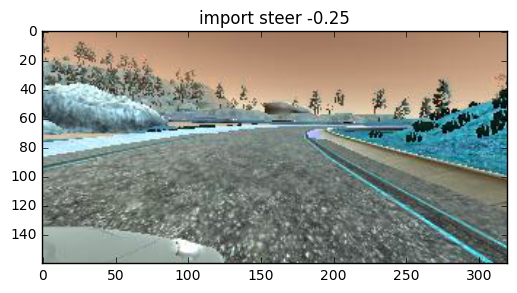

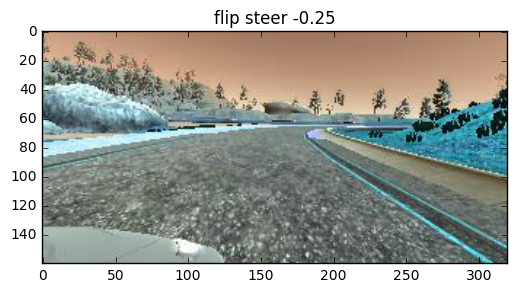

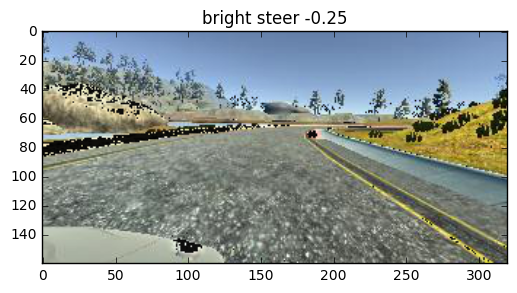

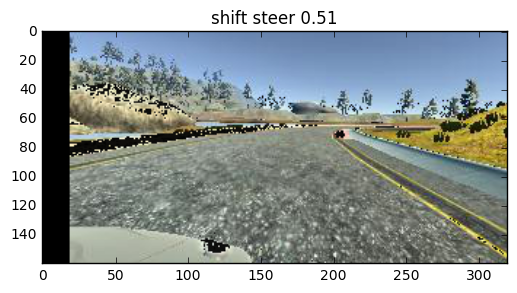

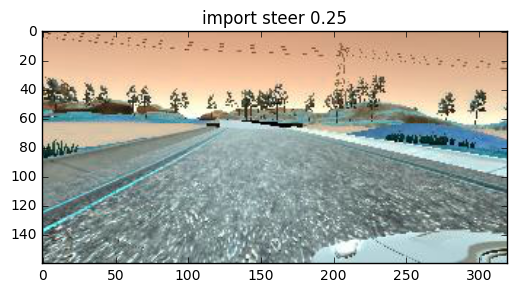

...

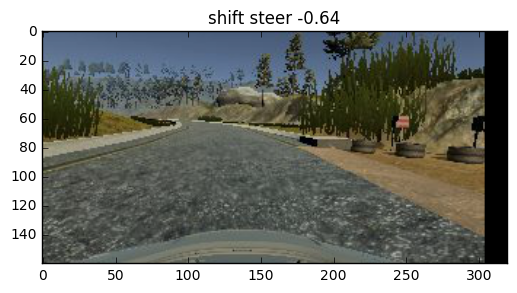

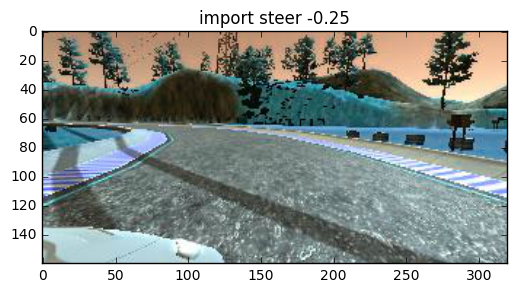

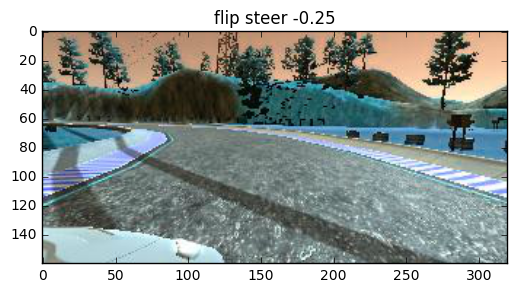

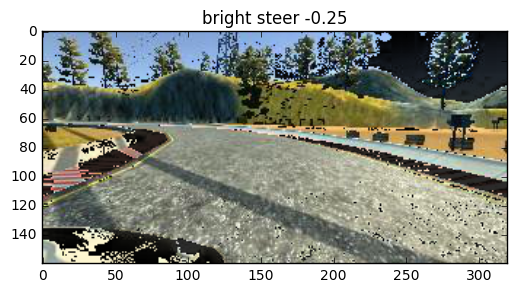

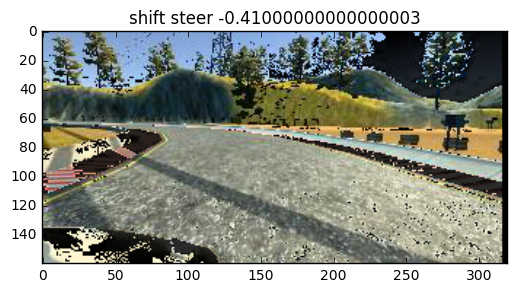

In [31]:
i = 0
for sample, steer in train_batch_generator(train_data):
    #print('sample', sample[0][10:15, 10:15, 1])
    #print('sample',sample[1][10:15, 10:15, 1])
    #print(steer)
    #fig, ax = plt.subplots(1,2, figsize = (24,15))
    #ax[0].imshow(np.uint8(sample[0]))
    #ax[1].imshow(np.uint8(sample[1]))
    i +=1
    if i == 2:
        break

160 320


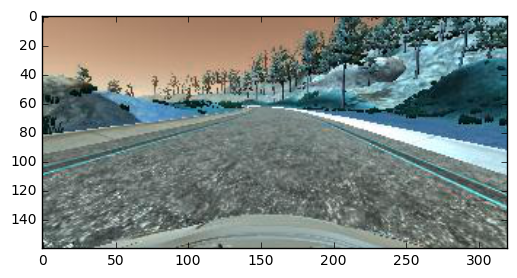

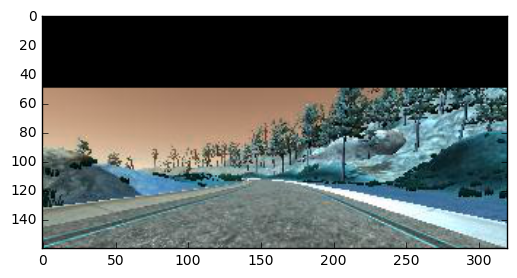

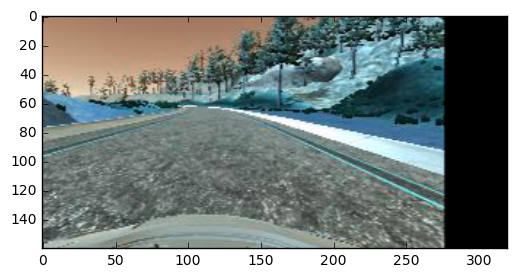

In [23]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

img = mpimg.imread('/home/minh/Documents/Online_courses/CarND/Behavioral_Cloning/simulator-linux/IMG/center_2017_01_19_17_00_13_460.jpg')
rows,cols = img.shape[:2]
print(rows, cols)

plt.figure()
plt.imshow(img)


M = np.float32([[1,0,0],[0,1,50]])
dst = cv2.warpAffine(img,M,(cols,rows))

plt.figure()
plt.imshow(dst)


M = np.float32([[1,0,-43.7],[0,1,0]])
dst = cv2.warpAffine(img,M,(cols,rows))

plt.figure()
plt.imshow(dst)


#cv2.imshow('img',dst)
#cv2.waitKey(0)
#cv2.destroyAllWindows()

In [8]:
import csv
with open('./simulator-linux/driving_log_1.csv', 'r') as f:
    car_reader = csv.reader(f)
    data = [row for row in car_reader]
print(len(data))
for i in range(6):
    print(data[i])


3252
['/home/minh/Documents/Online_courses/CarND/Behavioral_Cloning/simulator-linux/IMG/center_2017_01_19_17_00_13_460.jpg', ' /home/minh/Documents/Online_courses/CarND/Behavioral_Cloning/simulator-linux/IMG/left_2017_01_19_17_00_13_460.jpg', ' /home/minh/Documents/Online_courses/CarND/Behavioral_Cloning/simulator-linux/IMG/right_2017_01_19_17_00_13_460.jpg', ' 0', ' 1', ' 0', ' 30.19029']
['/home/minh/Documents/Online_courses/CarND/Behavioral_Cloning/simulator-linux/IMG/center_2017_01_19_17_00_13_587.jpg', ' /home/minh/Documents/Online_courses/CarND/Behavioral_Cloning/simulator-linux/IMG/left_2017_01_19_17_00_13_587.jpg', ' /home/minh/Documents/Online_courses/CarND/Behavioral_Cloning/simulator-linux/IMG/right_2017_01_19_17_00_13_587.jpg', ' 0', ' 1', ' 0', ' 30.19029']
['/home/minh/Documents/Online_courses/CarND/Behavioral_Cloning/simulator-linux/IMG/center_2017_01_19_17_00_13_702.jpg', ' /home/minh/Documents/Online_courses/CarND/Behavioral_Cloning/simulator-linux/IMG/left_2017_01_19_

In [14]:
with open('./simulator-linux/driving_log_1.csv', 'r') as f:
    data2 = [line.strip().split(', ') for line in f]
print(len(data2))
for i in range(6):
    print(data2[i])

3252
['/home/minh/Documents/Online_courses/CarND/Behavioral_Cloning/simulator-linux/IMG/center_2017_01_19_17_00_13_460.jpg', '/home/minh/Documents/Online_courses/CarND/Behavioral_Cloning/simulator-linux/IMG/left_2017_01_19_17_00_13_460.jpg', '/home/minh/Documents/Online_courses/CarND/Behavioral_Cloning/simulator-linux/IMG/right_2017_01_19_17_00_13_460.jpg', '0', '1', '0', '30.19029']
['/home/minh/Documents/Online_courses/CarND/Behavioral_Cloning/simulator-linux/IMG/center_2017_01_19_17_00_13_587.jpg', '/home/minh/Documents/Online_courses/CarND/Behavioral_Cloning/simulator-linux/IMG/left_2017_01_19_17_00_13_587.jpg', '/home/minh/Documents/Online_courses/CarND/Behavioral_Cloning/simulator-linux/IMG/right_2017_01_19_17_00_13_587.jpg', '0', '1', '0', '30.19029']
['/home/minh/Documents/Online_courses/CarND/Behavioral_Cloning/simulator-linux/IMG/center_2017_01_19_17_00_13_702.jpg', '/home/minh/Documents/Online_courses/CarND/Behavioral_Cloning/simulator-linux/IMG/left_2017_01_19_17_00_13_702.

In [24]:
batch_size = 512
n_row = 160
n_col = 320

batch_sample = np.zeros((batch_size, n_row, n_col,3))
batch_steer = np.zeros((batch_size,)).reshape(-1,1)

In [25]:
print(batch_sample.shape)
print(batch_steer.shape)



(512, 160, 320, 3)
(512, 1)


In [20]:
import numpy as np
import tensorflow as tf
import keras
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline
import cv2
import glob

Using TensorFlow backend.


In [2]:
df = pd.read_csv('./simulator-linux/driving_log_1.csv', header=None, 
                 names = ['Center_image', 'Left_Image', 'Right_image', 'Steering_angle', 'Throttle', 'Break', 'Speed'])
                 #dtype = {'Steering_angle': 'np.float32'} )

In [11]:
df.tail()

,Center_image,Left_Image,Right_image,Steering_angle,Throttle,Break,Speed
3247,/home/minh/Documents/Online_courses/CarND/Beha...,/home/minh/Documents/Online_courses/CarND/Beh...,/home/minh/Documents/Online_courses/CarND/Beh...,0.0,0.0,0,0.000301
3248,/home/minh/Documents/Online_courses/CarND/Beha...,/home/minh/Documents/Online_courses/CarND/Beh...,/home/minh/Documents/Online_courses/CarND/Beh...,0.0,0.0,0,0.000300
3249,/home/minh/Documents/Online_courses/CarND/Beha...,/home/minh/Documents/Online_courses/CarND/Beh...,/home/minh/Documents/Online_courses/CarND/Beh...,0.0,0.0,0,0.000307
3250,/home/minh/Documents/Online_courses/CarND/Beha...,/home/minh/Documents/Online_courses/CarND/Beh...,/home/minh/Documents/Online_courses/CarND/Beh...,0.0,0.0,0,0.000297
3251,/home/minh/Documents/Online_courses/CarND/Beha...,/home/minh/Documents/Online_courses/CarND/Beh...,/home/minh/Documents/Online_courses/CarND/Beh...,0.0,0.0,0,0.000301


In [4]:
def import_steering_angle(file, adjust_angle = 0.25):
    steering_angle = {}
    with open('./simulator-linux/driving_log_1.csv', 'r') as f:
        for line in f:
            l = line.split(',')
            angle = float(l[3].strip())
            steering_angle[l[0].strip()] = angle
            steering_angle[l[1].strip()] = angle + adjust_angle
            steering_angle[l[2].strip()] = angle - adjust_angle
    return steering_angle

steering_angle = import_steering_angle('./simulator-linux/driving_log_1.csv')
print(len(steering_angle))

9756


In [5]:
print(steering_angle['/home/minh/Documents/Online_courses/CarND/Behavioral_Cloning/simulator-linux/IMG/center_2017_01_19_17_00_13_460.jpg'])

0.0


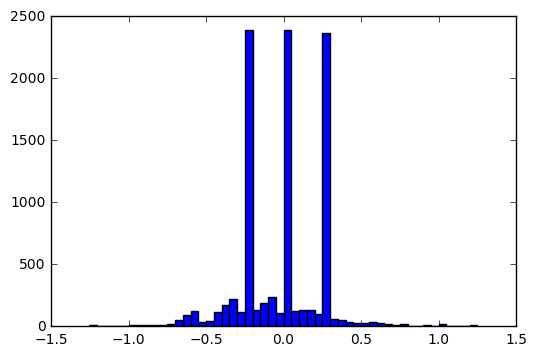

In [6]:
steering_values = list(steering_angle.values())
plt.hist(steering_values, bins=50);

### Data pre_processing and aumentation

In [19]:
import glob
import matplotlib.image as mpimg
path = '/home/minh/Documents/Online_courses/CarND/Behavioral_Cloning/simulator-linux/IMG/*'
files = glob.glob(path) 
print(len(files))
print(files[0])
print(mpimg.imread(files[0]).shape)

9579
/home/minh/Documents/Online_courses/CarND/Behavioral_Cloning/simulator-linux/IMG/left_2017_01_19_17_04_06_936.jpg
(160, 320, 3)


(160, 320, 3)


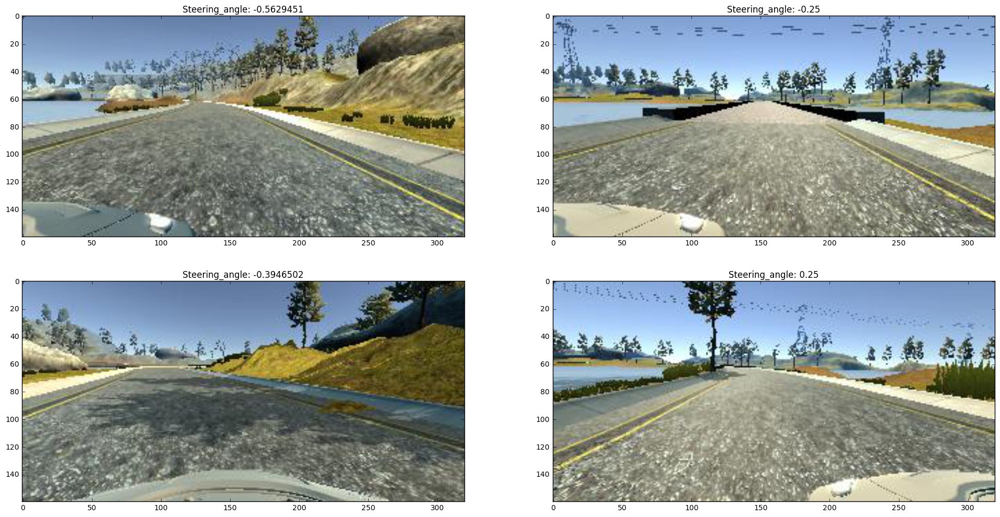

In [8]:
#prefix = '/home/minh/Documents/Online_courses/CarND/Behavioral_Cloning'
img = mpimg.imread(files[0])
print(img.shape)
fig, axes = plt.subplots(2,2, figsize = (24,12))
for i in range(4):
    id = np.random.choice(len(files))
    img = mpimg.imread(files[id])
    axes.flat[i].imshow(img)
    #key = prefix + files[id][1:]
    key = '/home/minh/Documents/Online_courses/CarND/Behavioral_Cloning/simulator-linux/IMG/center_2017_01_19_17_00_13_460.jpg'
    key2 = '/home/minh/Documents/Online_courses/CarND/P3_Behavioral_Cloning/simulator-linux/IMG/center_2017_01_19_17_01_49_270.jpg'
    axes.flat[i].set_title('Steering_angle: {}'.format(str(steering_angle[files[id]])))
    #axes.flat[i].set_title('Steering_angle: {}'.format(steering_angle[key]))